**VM: Deep Learning mit Python - Model from scratch**

*Group: Leo Giesen, Johannes Kauffmann*

Case Study: Create deep learning model to predict Land Use and Land Cover data drom satellite pictures.

# Imports and definitions

In [ ]:
# Import of packages

%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
import numpy as np

from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv3D, MaxPooling3D, Dropout, BatchNormalization
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from keras.callbacks import EarlyStopping

import calendar
import os
from google.colab import drive
from packaging import version

assert version.parse(tf.__version__) >= version.parse('2.5.0')

In [ ]:
# mount Google drive to get the data

drive.mount('/content/gdrive', force_remount=False)
root_path = 'gdrive/My Drive/Wirtschaftsinformatik/lulc_data'

Mounted at /content/gdrive


In [ ]:
# Class names

class_names = {
    0: "No Data", 
    1: "Cultivated Land",
    2: "Forest",
    3: "Grassland",
    4: "Shrubland",
    5: "Water",
    6: "Wetlands",
    7: "Tundra",
    8: "Artificial Surface",
    9: "Bareland",
    10: "Snow and Ice"
}

In [ ]:
# Channel names

channel_names = {
    1: "Red",
    2: "Green",
    3: "Blue",
    4: "NIR 1",
    5: "NIR 2",
    6: "NIR 3"
}

In [ ]:
color_map = {
    0:  np.array([  0,   0,   0]), #0: "No Data" 
    1:  np.array([240, 218, 173]), #1: "Cultivated Land" 
    2:  np.array([ 33,  87,  18]), #2: "Forest" 
    3:  np.array([153, 196,  61]), #3: "Grassland" 
    4:  np.array([141,  77,  45]), #4: "Shrubland"
    5:  np.array([  0,   5, 247]), #5: "Water"
    6:  np.array([ 95, 250, 253]), #6: "Wetlands"
    7:  np.array([230, 189,  41]), #7: "Tundra" - not present in data
    8:  np.array([236,  48,  29]), #8: "Artificial Surface" 
    9:  np.array([224, 180, 132]), #9: "Bareland" - not present in data
    10: np.array([189, 189, 189]), #10: "Snow and Ice" - not present in data
} 

# Data loading and exploration

**Loading data**

In [ ]:
data = data = np.load(root_path + '/train.npz')
bands = data['bands'] # data: 10.000 patches, each for twelve months and with six channels. Resolution: 33x33 pixels
lulc = data['lulc'] # labels for central pixel of patches (Land Use and Land Cover)
print(bands.shape)
print(lulc.shape)

(10000, 12, 33, 33, 6)
(10000,)


**Examine data**

In [ ]:
#%%script false
# show number of instances per class

count_classes = []
for i in range(11): 
    val = np.count_nonzero(lulc == i)
    print("class "+str(i)+": "+str(val))
    count_classes.append(val)
#print(count_classes)

class 0: 1308
class 1: 238
class 2: 5796
class 3: 1125
class 4: 770
class 5: 58
class 6: 0
class 7: 0
class 8: 217
class 9: 488
class 10: 0


findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


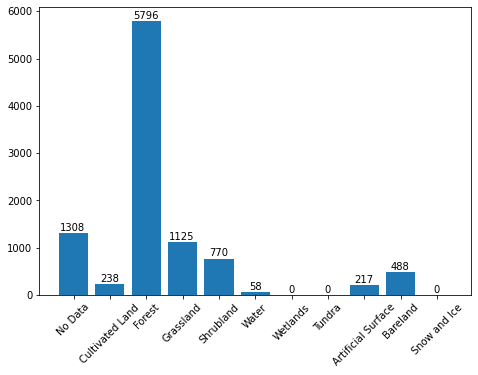

In [ ]:
#%%script false

# set the font globally
plt.rcParams.update({'font.family':'Lato'})

# print bar chart
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
classes = list(class_names.values())
ax.bar(classes,count_classes)
plt.xticks(rotation=45)
for i in range(11):
    val = str(count_classes[i])
    plt.text(
        i - len(val)/11, #X coordinate 
        count_classes[i] + 50, #Y coordinate
        val) #string
plt.show()

--> Realization: Class 2 is over-represented. Classes 6, 7 and 10 are not present in the data set at all.

Channels from patch no. 250
Central pixel is labeled as Cultivated Land


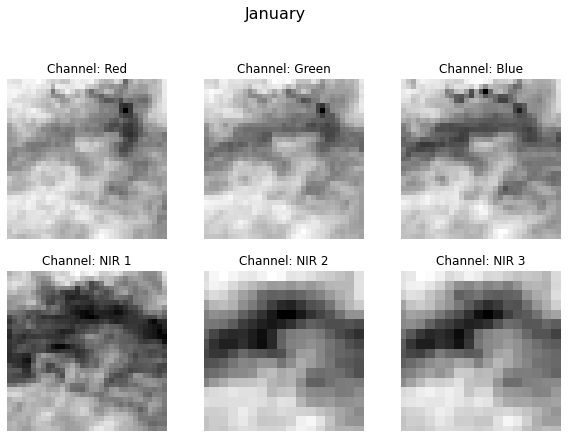

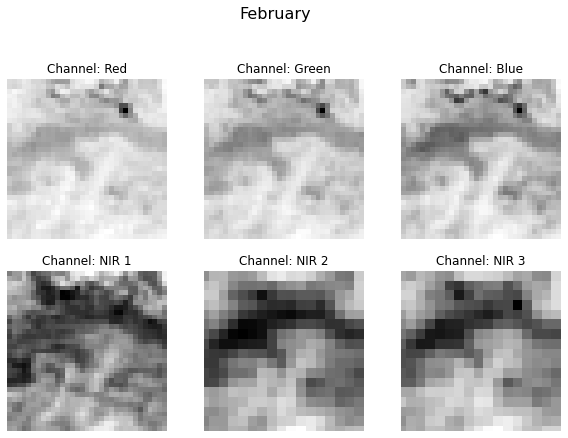

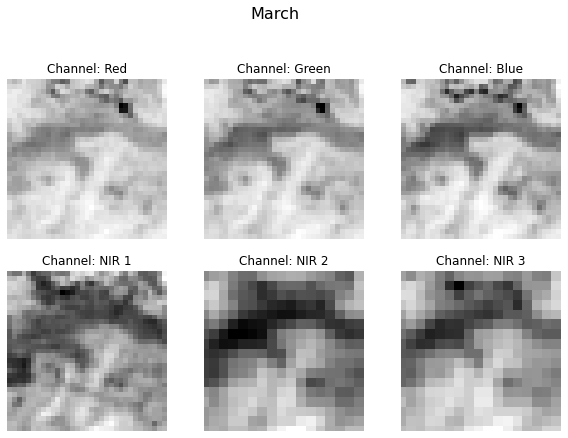

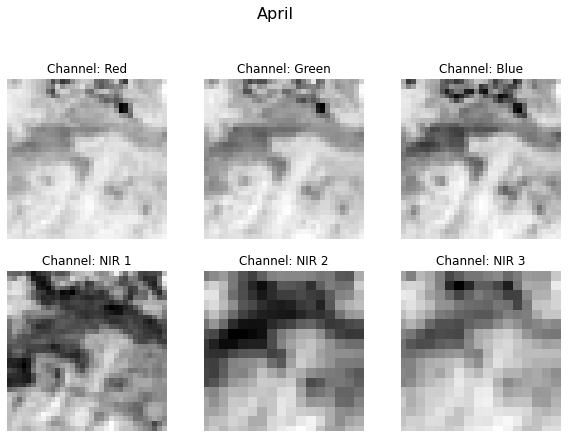

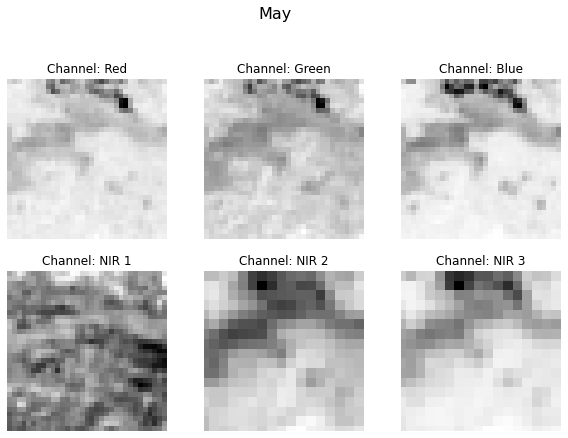

...

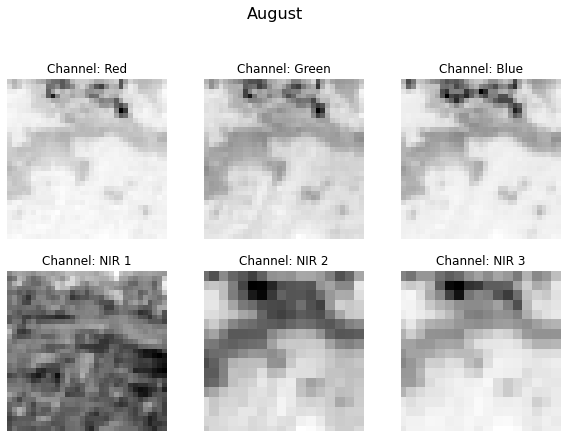

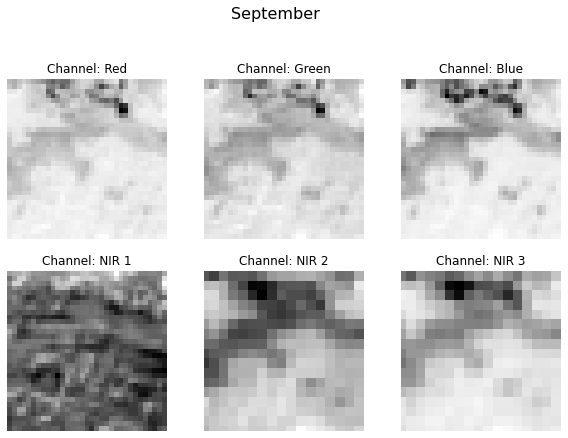

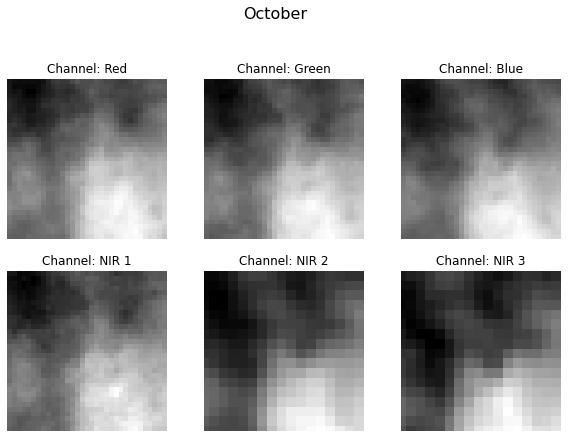

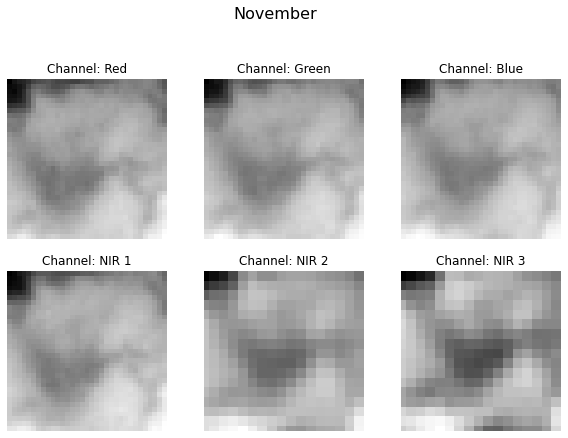

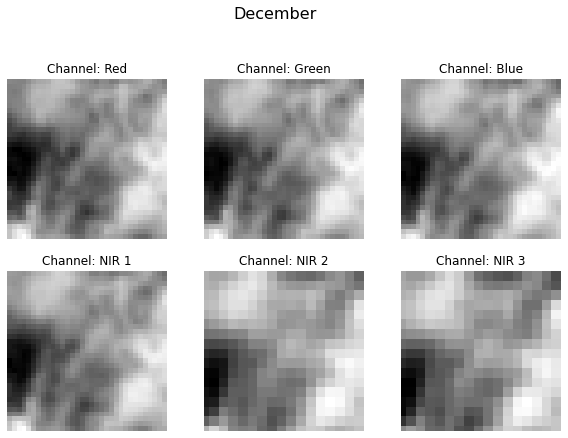

In [ ]:
#%%script false
# Show some images

patch = 250 # random patch number

print("Channels from patch no. " + str(patch))
print("Central pixel is labeled as " + class_names[lulc[patch]])

for month in range(12):
    plt.figure(figsize=(10, 10))
    for channel in range(6): #show all six channels
        ax = plt.subplot(3, 3, channel+1)
        image = bands[patch, month, :, :, channel]
        plt.imshow(image, cmap = plt.cm.binary)
        plt.title("Channel: " + channel_names[channel+1])
        plt.suptitle(calendar.month_name[month+1], size=16)
        plt.axis("off")

# Data Preparation

**Split data into train, validation and test data**

In [ ]:
X = bands
y = lulc

# split into train, test, vaildation sets
X_train_all, X_test, y_train_all, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.20)
print(X_train.shape)

(6400, 12, 33, 33, 6)


In [ ]:
# clear variables to save RAM
del data
del bands
del lulc
del X
del y

**Class weights** 

In [ ]:
# Calculate class weights automatically
class_weights_array = class_weight.compute_class_weight('balanced',
                                                 np.unique(y_train),
                                                 y_train)

# Create dictionary for the class weights
class_weights_dict = {
    0: class_weights_array[0],
    1: class_weights_array[1],
    2: class_weights_array[2],
    3: class_weights_array[3],
    4: class_weights_array[4],
    5: class_weights_array[5],
    6: 0,
    7: 0,
    8: class_weights_array[6],
    9: class_weights_array[7],
    10: 0,
}

print(class_weights_dict)

{0: 0.9685230024213075, 1: 5.442176870748299, 2: 0.2127093858016485, 3: 1.1049723756906078, 4: 1.6326530612244898, 5: 23.529411764705884, 6: 0, 7: 0, 8: 6.451612903225806, 9: 2.7210884353741496, 10: 0}


**One-hot encoder**

In [ ]:
# one-hot encoder for categorical_crossentropy loss to work in model
depth = 11
y_train = tf.one_hot(y_train, depth)
y_val = tf.one_hot(y_val, depth)
y_test = tf.one_hot(y_test, depth)

**Data augmentation**

In [ ]:
#%%script false
# Create Tensorflow Dataset objects
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

print(tf.data.experimental.cardinality(train_ds))
print(tf.data.experimental.cardinality(val_ds))
print(tf.data.experimental.cardinality(test_ds))

tf.Tensor(6400, shape=(), dtype=int64)
tf.Tensor(1600, shape=(), dtype=int64)
tf.Tensor(2000, shape=(), dtype=int64)


In [ ]:
# clear variables to have more RAM
del X_train
del y_train
del X_val
del y_val

Code from: [Tensorflow - Data augmentation Tutorial](https://www.tensorflow.org/tutorials/images/data_augmentation)

In [ ]:
#%%script false
# create data augmentation layer
data_augmentation_ver = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip('vertical'),
    #tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)
])

data_augmentation_hor = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
    #tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)
])

batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE

# define prepare function from tensorflow website
def prepare(ds, shuffle=False, augment=False):
  if shuffle:
    ds = ds.shuffle(1000)

  # Use data augmentation only on the training set
  if augment:
    import random
    rand = random.uniform(0, 1)
    if rand == 0:
      ds = ds.map(lambda x, y: (data_augmentation_hor(x, training=True), y), 
                num_parallel_calls=AUTOTUNE)
    else:
      ds = ds.map(lambda x, y: (data_augmentation_ver(x, training=True), y), 
                num_parallel_calls=AUTOTUNE)
    
  # Batch all datasets
  ds = ds.batch(batch_size)

  # Use buffered prefecting on all datasets
  return ds.prefetch(buffer_size=AUTOTUNE)

train_ds = prepare(train_ds, shuffle=True, augment=False)
val_ds = prepare(val_ds, shuffle=True)
test_ds = prepare(test_ds, shuffle=True)

print(tf.data.experimental.cardinality(train_ds))
print(tf.data.experimental.cardinality(val_ds))
print(tf.data.experimental.cardinality(test_ds))

tf.Tensor(200, shape=(), dtype=int64)
tf.Tensor(50, shape=(), dtype=int64)
tf.Tensor(63, shape=(), dtype=int64)


# Model choosing

**Build 3D CNN Model from scratch**

In [ ]:
#previous version (vor dem Test mit 40%)
#1
base_model = Sequential() # sequential model
base_model.add(Conv3D(32, kernel_size=(4, 4, 4), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(12, 33, 33, 6)))
base_model.add(Conv3D(32, kernel_size=(4, 4, 4), activation='relu', kernel_initializer='he_uniform'))

base_model.add(tf.keras.layers.Lambda(tf.nn.local_response_normalization))
base_model.add(MaxPooling3D(pool_size=(4, 4, 4)))
base_model.add(BatchNormalization(center=True, scale=True))
base_model.add(Dropout(0.4))
#2
base_model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
base_model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform'))

base_model.add(BatchNormalization(center=True, scale=True))
base_model.add(Dropout(0.4))
#3
base_model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
base_model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform'))

base_model.add(MaxPooling3D(pool_size=(3, 3, 3)))
base_model.add(BatchNormalization(center=True, scale=True))
#4
base_model.add(Flatten())
base_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))

base_model.add(Dropout(0.4))
base_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))

base_model.add(Dropout(0.4))
base_model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))

base_model.add(Dropout(0.4))
base_model.add(Dense(11, activation='softmax')) # number of outputs, in our case eleven different classes

ValueError: ignored

In [ ]:
#adapted model -> 40% accuracy
%%script false
base_model = Sequential() # sequential model
base_model.add(Conv3D(32, kernel_size=(4, 4, 4), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(12, 33, 33, 6)))
base_model.add(Conv3D(32, kernel_size=(4, 4, 4), activation='relu', kernel_initializer='he_uniform'))
#base_model.add(tf.keras.layers.Lambda(tf.nn.local_response_normalization))
base_model.add(BatchNormalization(center=True, scale=True))
base_model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
base_model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform'))

base_model.add(BatchNormalization(center=True, scale=True))
base_model.add(Dropout(0.4))
base_model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
base_model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu', kernel_initializer='he_uniform'))
base_model.add(MaxPooling3D(pool_size=(3, 3, 3)))
base_model.add(BatchNormalization(center=True, scale=True))

base_model.add(Flatten())
base_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
base_model.add(Dropout(0.4))
base_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
base_model.add(Dropout(0.4))
base_model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
base_model.add(Dense(11, activation='softmax'))

In [ ]:
base_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
base_model.summary()

# Model training

**Define callbacks**

In [ ]:
def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

learningrate_cb = tf.keras.callbacks.LearningRateScheduler(scheduler)
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience = 15)
checkpoint_cb = keras.callbacks.ModelCheckpoint("own_model.h5", save_best_only=True)

**Fitting Model**

In [ ]:
#%%script false
# history = base_model.fit(X_train, y_train, epochs=100, batch_size=32, 
#                     validation_data=(X_val, y_val), callbacks=[checkpoint_cb, early_stopping_cb],
#                     class_weight=class_weights_dict)
%%timeit
history = base_model.fit(train_ds, epochs=100, batch_size=32, 
                    validation_data=val_ds, callbacks=[checkpoint_cb, early_stopping_cb, learningrate_cb],
                    class_weight=class_weights_dict)

# Evaluation

In [ ]:
#%%script false
# Calculate loss and accuracy
base_model.evaluate(X_test, y_test)

In [ ]:
#%%script false
#Plot accuracy and loss of train and val set
plt.figure(figsize=(11,4))
plt.subplot(121)
plt.plot(history.history['accuracy'], color="green")
plt.plot(history.history['val_accuracy'], color="blue")
plt.title("Accuracy", fontsize=16)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'val'], loc='lower right')
plt.subplot(122)
plt.plot(history.history['loss'], color="red",)
plt.plot(history.history['val_loss'], color="orange")
plt.title("Loss", fontsize=16)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

# Make Predictions

In [ ]:
#%%script false
#base_model.save('gdrive/My Drive/Wirtschaftsinformatik/lulc_data/own_trainingData_210714.h5') # save model in root directory
#Error: model = keras.models.load_model('own_model.h5')
base_model = keras.models.load_model('gdrive/My Drive/Wirtschaftsinformatik/lulc_data/own_trainingData_210714.h5')

**Testing on Public Test Set**

In [ ]:
data_public_test = np.load(root_path + '/public_test.npz') # load public test set
bands_public_test = data_public_test['bands'] # extract only layer called 'bands'
print(bands_public_test.shape)

(12, 500, 500, 6)


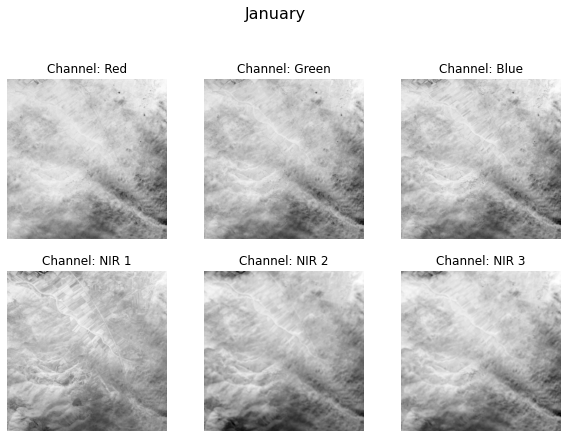

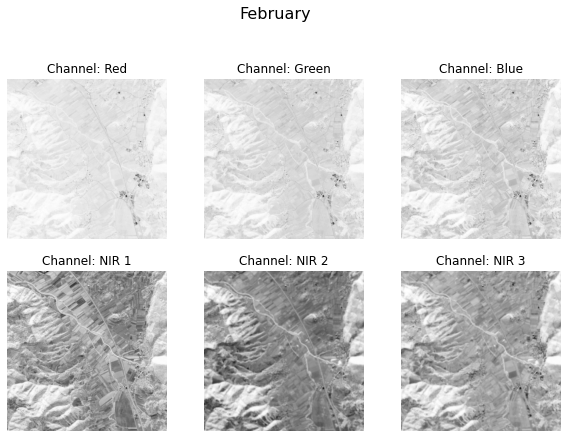

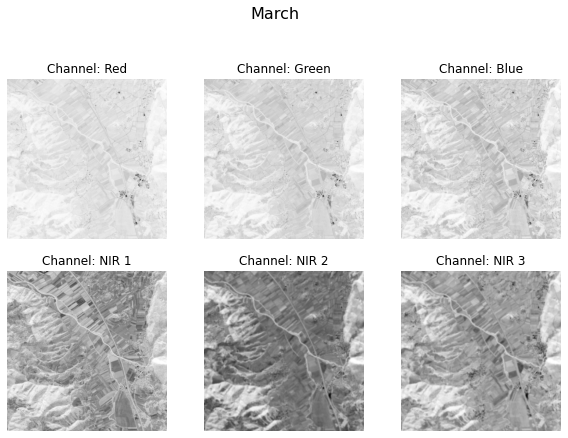

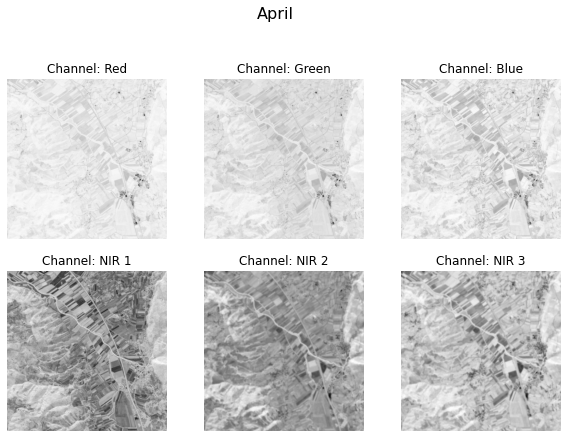

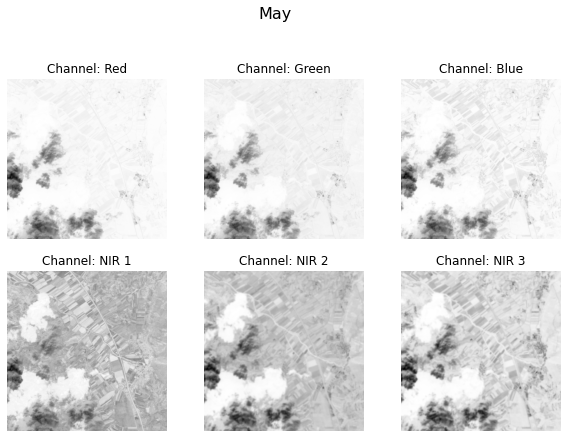

...

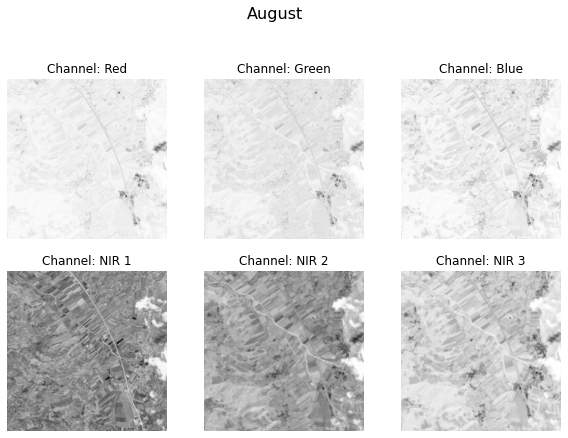

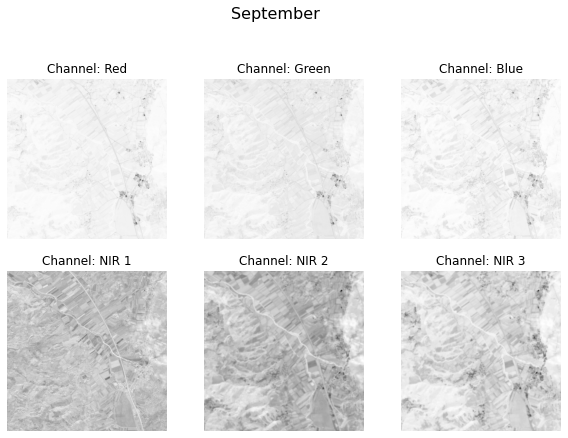

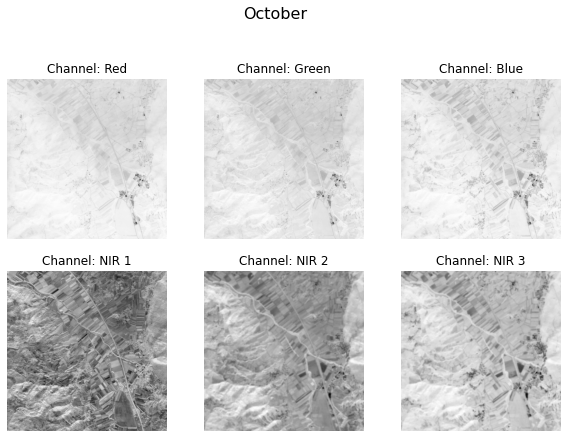

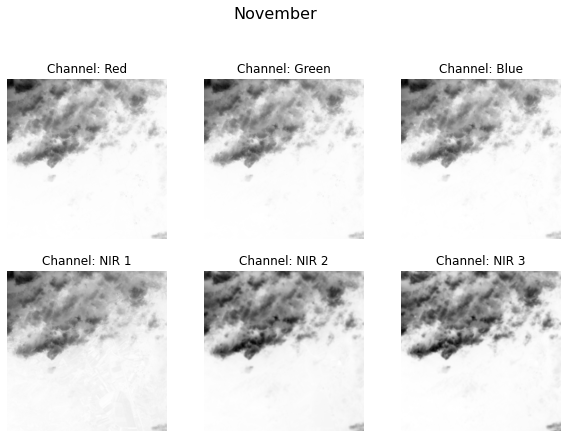

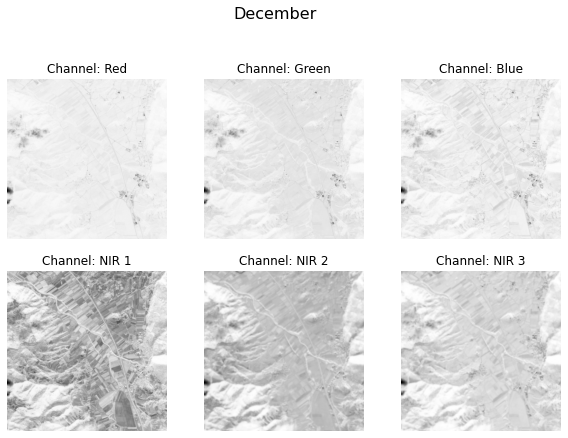

In [ ]:
# Show all 12 monthly images of the public test set

for month in range(12):
    plt.figure(figsize=(10, 10))
    for channel in range(6): #show all six channels
        ax = plt.subplot(3, 3, channel+1)
        image = bands_public_test[month, :, :, channel]
        plt.imshow(image, cmap = plt.cm.binary)
        plt.title("Channel: " + channel_names[channel+1])
        plt.suptitle(calendar.month_name[month+1], size=16)
        plt.axis("off")

**Padding**

To be able to use the sliding window approach on the public test set.

In [ ]:
bands_public_test_pad = np.zeros(shape=(12, 532, 532, 6)) # get empty array with correct shape

# perform padding for all images (months and channels)
for month in range(12):
    for channel in range(6):
        bands_public_test_pad[month, :, :,channel] = np.pad(bands_public_test[month, :, :,channel],
                                                            ((16,16),(16,16)), 'constant')
        
print(bands_public_test_pad.shape)

(12, 532, 532, 6)


Test padding by printing out the images of the public test set.

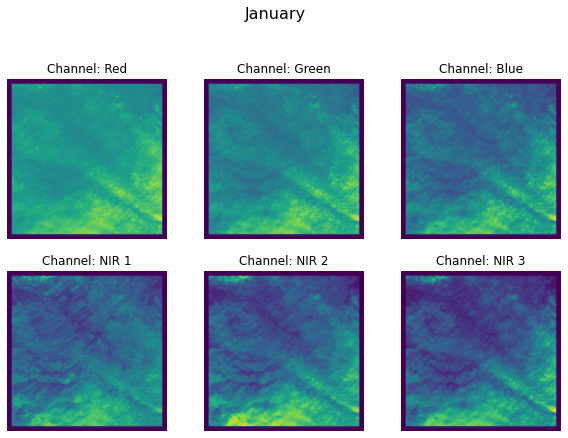

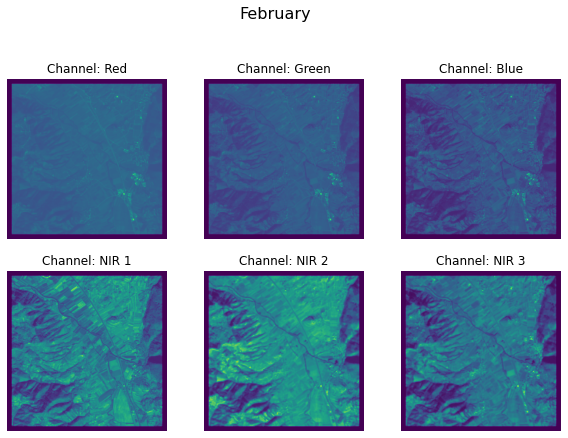

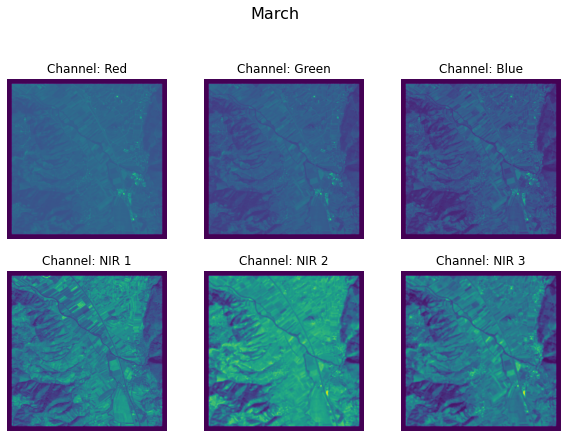

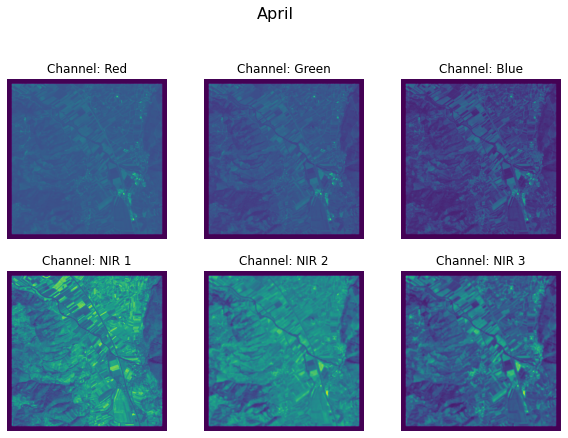

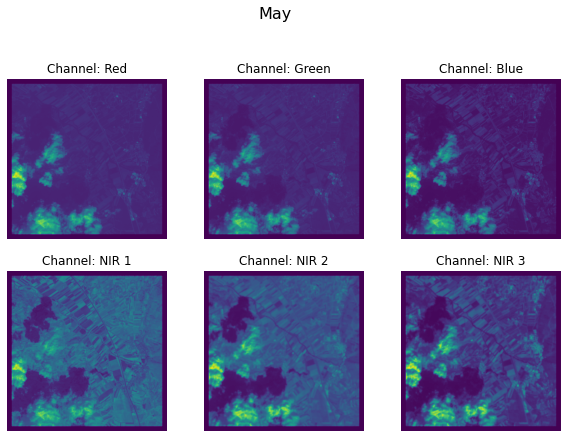

...

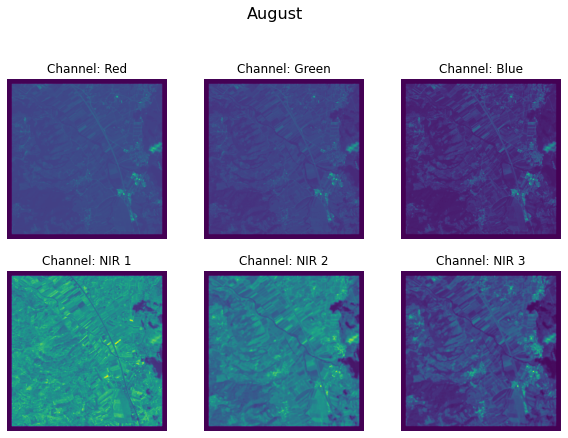

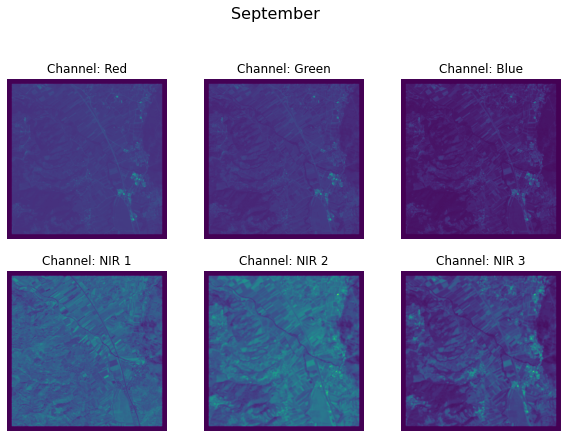

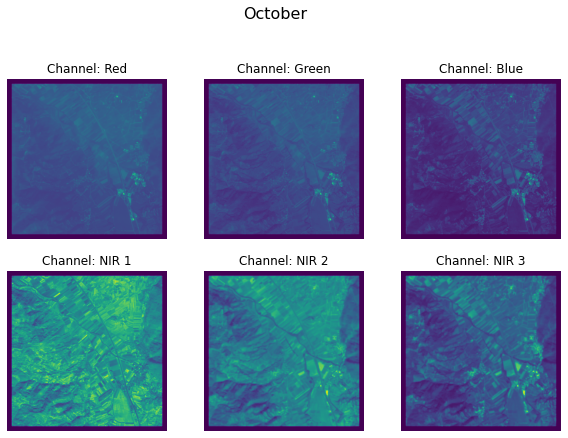

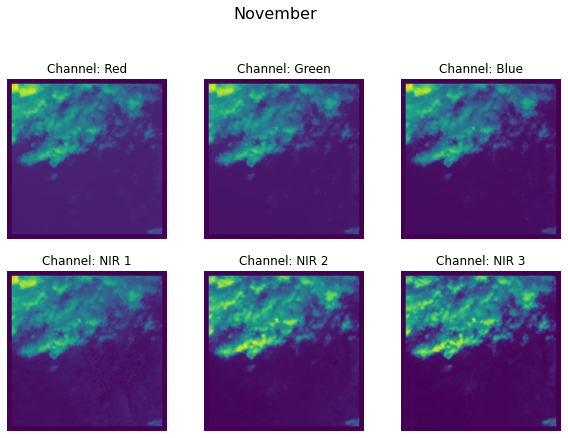

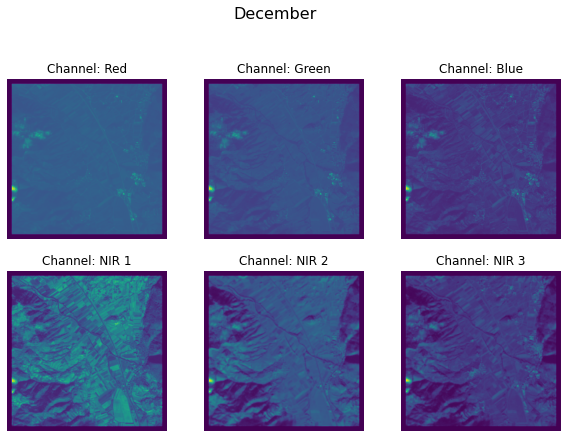

In [ ]:
for month in range(12):
    plt.figure(figsize=(10, 10))
    for channel in range(6): #show all six channels
        ax = plt.subplot(3, 3, channel+1)
        image = bands_public_test_pad[month, :, :, channel]
        plt.imshow(image)
        plt.title("Channel: " + channel_names[channel+1])
        plt.suptitle(calendar.month_name[month+1], size=16)
        plt.axis("off") 

In [ ]:
#1: NP array
y_pred_public_test = np.zeros((468,468), dtype=int)
# add one dimension to be able feeding our model

#bands_public_test = np.expand_dims(bands_public_test, 0)
bands_public_test_pad = np.expand_dims(bands_public_test_pad, 0)
bands_public_test_pad.shape

#2: list
#y_pred_public_test = [[0]*468]*468 # 2D Liste 

#len(y_pred_public_test[5])
y_pred_public_test.shape
#[2][444]

(468, 468)

**Naive sliding window approach**

Iterate the model over the whole public test image with stepsize one.

In [ ]:
# Ausschnittskoordinaten für die Prediction definieren
x_coord_start = 15
x_coord_end = x_coord_start + 33

pred_size = 468

#Zeile zuerst predicted, danach Spalte
for cur_row in range(pred_size):
    # Ausschnittskoordinaten für die nächste Prediction erhöht
    x_coord_end   += 1
    x_coord_start += 1
    y_coord_start = 15
    y_coord_end = y_coord_start + 33
    
    #y_pred_public_test_row = [] # Nr. 1
    for cur_col in range(pred_size):
        y_coord_end   += 1
        y_coord_start += 1
        # pass every month & color channel 
        current_cutout = bands_public_test_pad[:, :, x_coord_start:x_coord_end, y_coord_start:y_coord_end, :]
        #maybe month:month+1 with extra month loop (problematic, because you overwrite previous prediction

        y_pred = base_model.predict_classes(current_cutout)
        #del current_cutout
        y_pred_public_test[cur_row][cur_col] = y_pred[0] # Nr. 2 Alles direkt in Liste predicten 
        #y_pred_public_test_row.append(y_pred[0]) # Nr. 1 Spalte predicted

    #y_pred_public_test[cur_col] = y_pred_public_test_row # Nr. 1 Spalte in Liste hinzugefügt
    if(cur_row % 25 == 0):
      print(cur_row)
      #print(y_pred_public_test[cur_row]) # Spaltenprediction printen

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


0
25
50
75
100
125
150
175
200
225
250
275
300
325
350
375
400
425
450


In [ ]:
#y_pred_public_test = np.array(y_pred_public_test) #convert list to numpy array
#y_pred_public_test = np.asarray(y_pred_public_test) #convert list to numpy array

In [ ]:
y_pred_public_test

array([[1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 3, 4, 4],
       [2, 2, 2, ..., 3, 4, 4],
       [2, 2, 2, ..., 4, 4, 4]])

In [ ]:
#%%script false
with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_public.npy", "wb") as f:
    np.save(f, y_pred_public_test)

In [ ]:
%%script false
with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_public_test.npy", "rb") as f:
    y_pred_public_test = np.load(f)

**Visualization of the result for the public test set**

Code adapted from https://stackoverflow.com/questions/37719304/python-imshow-set-certain-value-to-defined-color

In [ ]:
# make a 3d numpy array that has a color channel dimension   
data_3d = np.ndarray(shape=(y_pred_public_test.shape[0], y_pred_public_test.shape[1],3), dtype=int)
for i in range(0, y_pred_public_test.shape[0]):
    for j in range(0, y_pred_public_test.shape[1]):
        data_3d[i][j] = color_map[y_pred_public_test[i,j]]
        #print(str(data_3d[i][j]) + "  -  " + str(y_pred_public_test[i,j]))

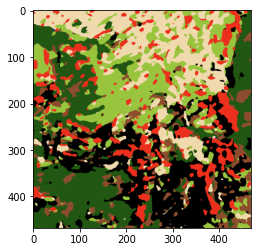

In [ ]:
# display the plot 
fig, ax = plt.subplots(1,1)
ax.imshow(data_3d)

# Hidden Test Set


In [ ]:
#%%script false
base_model = keras.models.load_model('gdrive/My Drive/Wirtschaftsinformatik/lulc_data/own_trainingData_210714.h5')

In [ ]:
data_public_test = np.load(root_path + '/hidden_test.npz') # load public test set
bands_public_test = data_public_test['bands'] # extract only layer called 'bands'
print(bands_public_test.shape)

(12, 1500, 1500, 6)


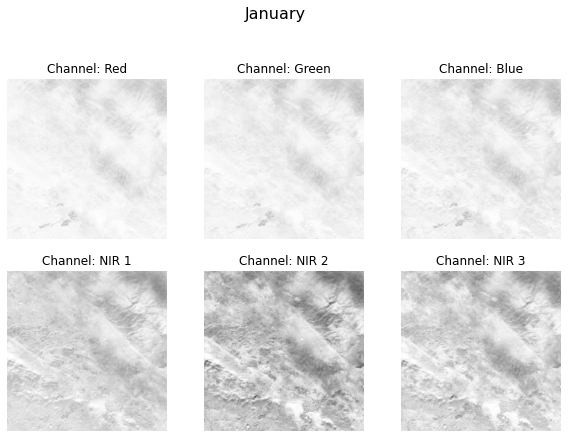

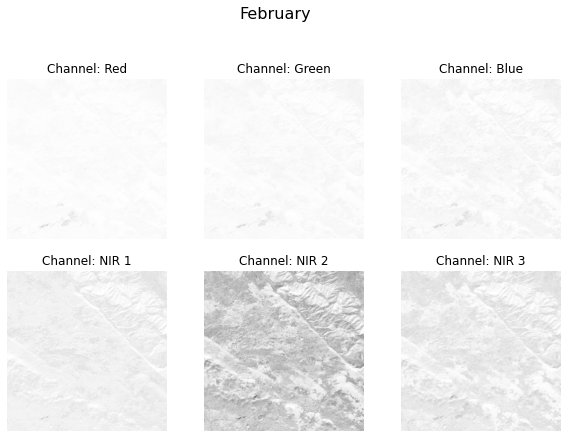

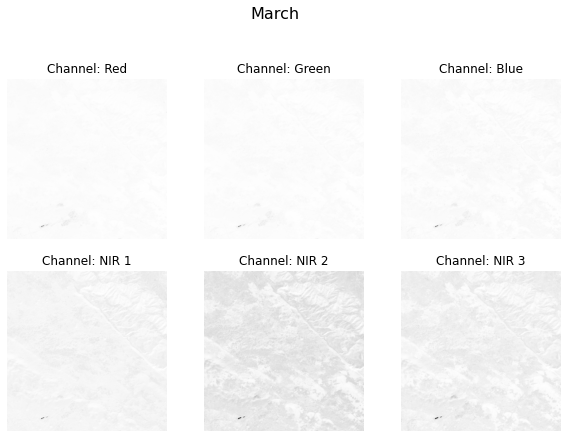

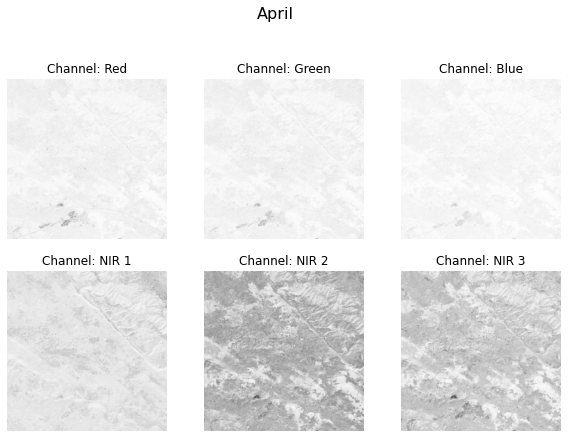

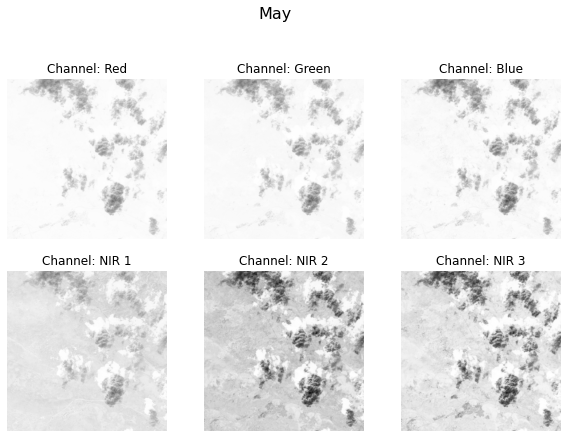

...

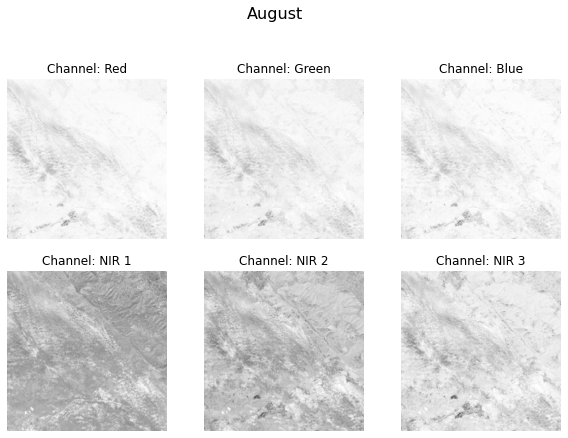

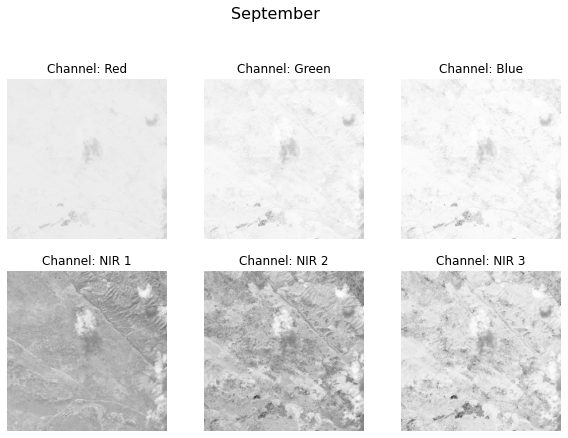

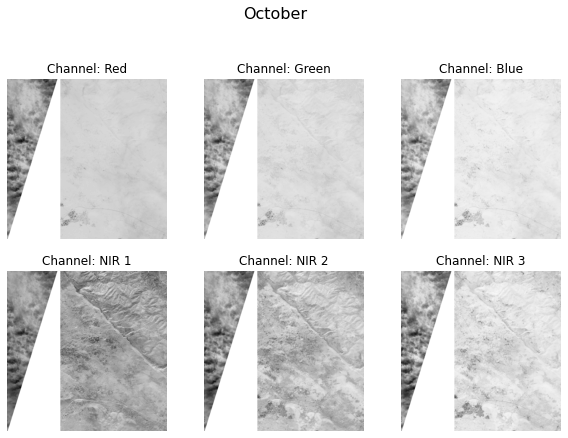

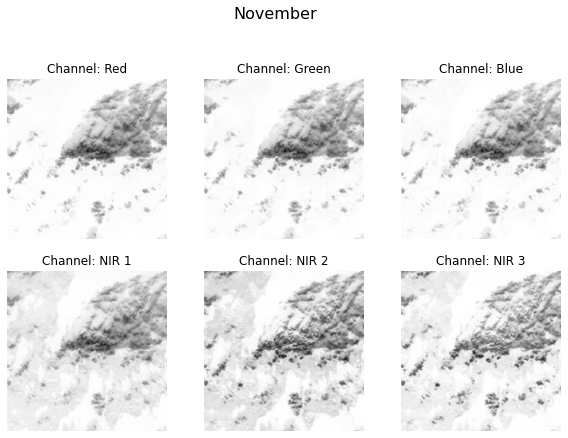

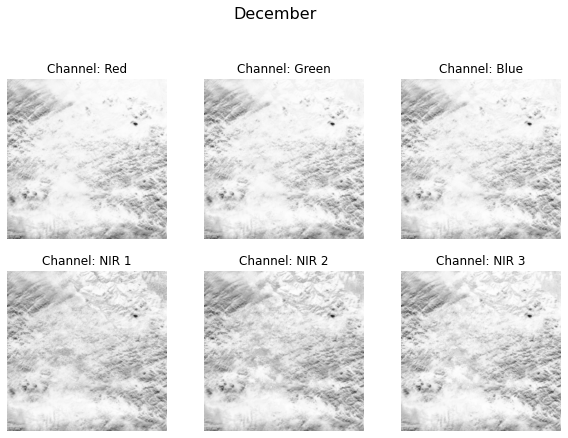

In [ ]:
# Show all 12 monthly images of the public test set

for month in range(12):
    plt.figure(figsize=(10, 10))
    for channel in range(6): #show all six channels
        ax = plt.subplot(3, 3, channel+1)
        image = bands_public_test[month, :, :, channel]
        plt.imshow(image, cmap = plt.cm.binary)
        plt.title("Channel: " + channel_names[channel+1])
        plt.suptitle(calendar.month_name[month+1], size=16)
        plt.axis("off")

In [ ]:
img_size = 1500

bands_public_test_pad = np.zeros(shape=(12, img_size + 32, img_size + 32, 6)) # get empty array with correct shape

# perform padding for all images (months and channels)
for month in range(12):
    for channel in range(6):
        bands_public_test_pad[month, :, :,channel] = np.pad(bands_public_test[month, :, :,channel],
                                                            ((16,16),(16,16)), 'constant')
        
print(bands_public_test_pad.shape)

(12, 1532, 1532, 6)


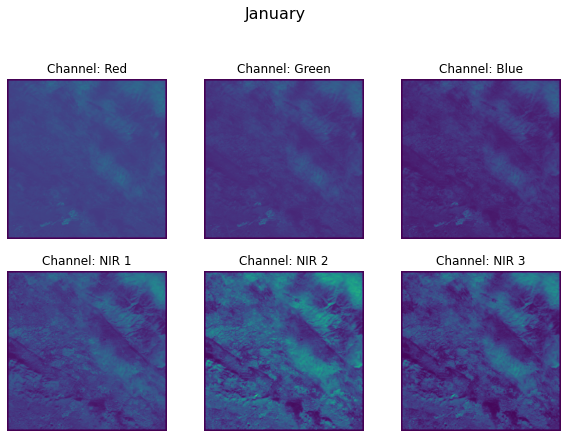

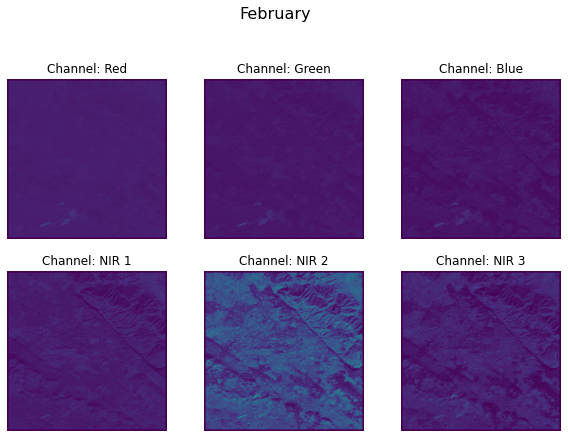

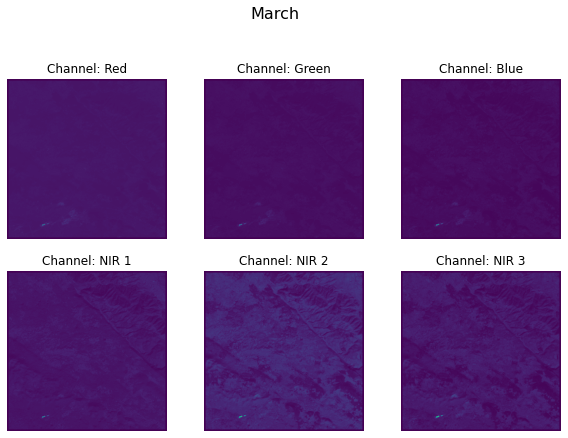

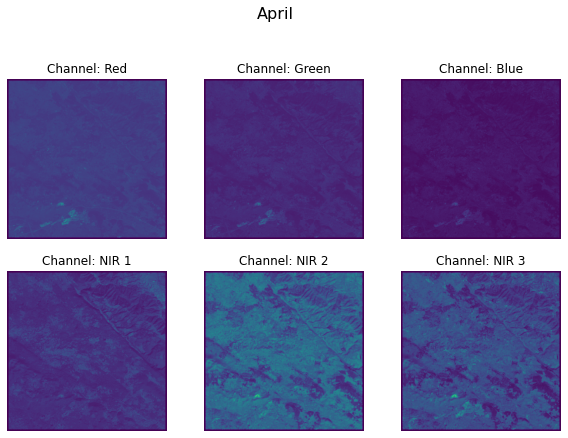

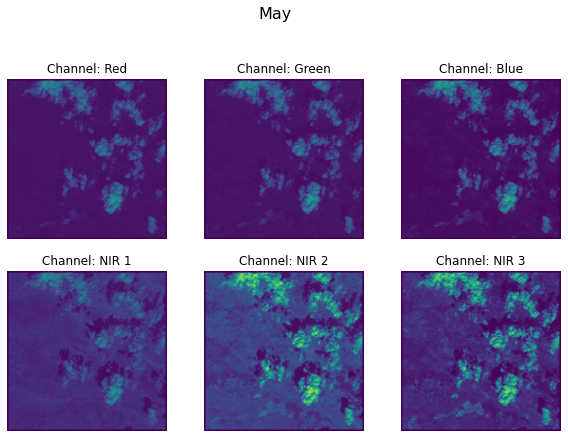

...

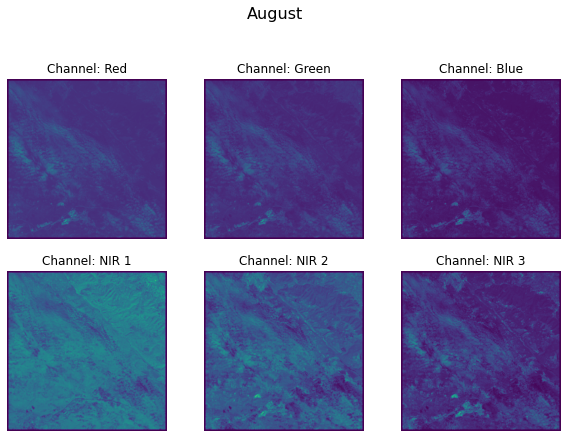

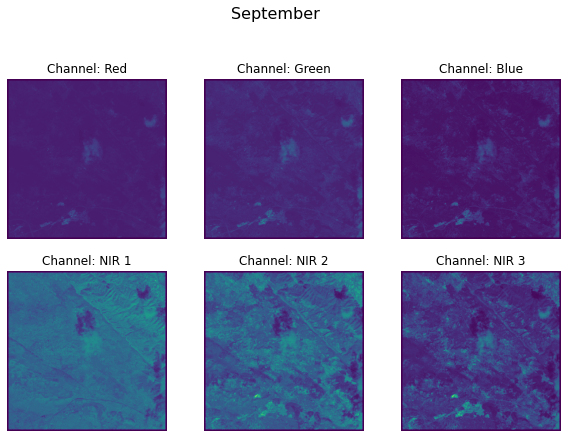

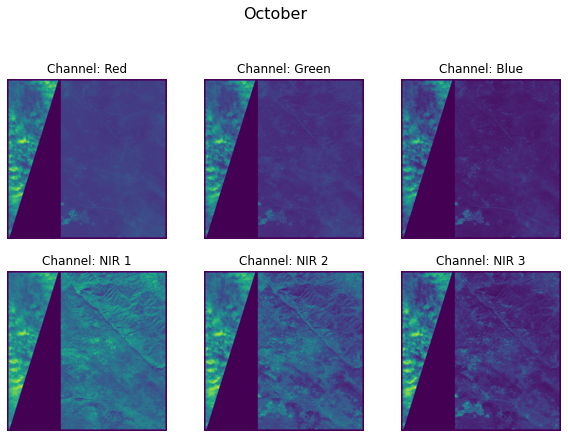

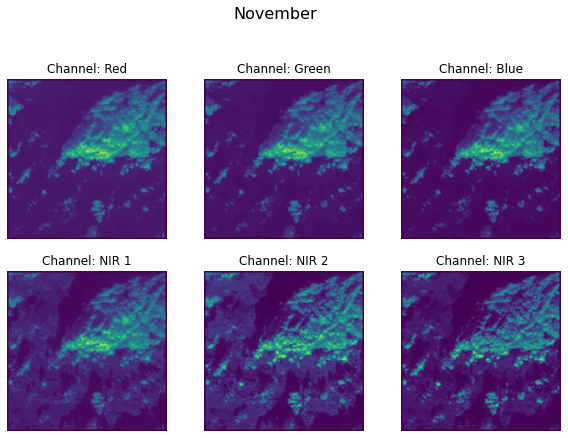

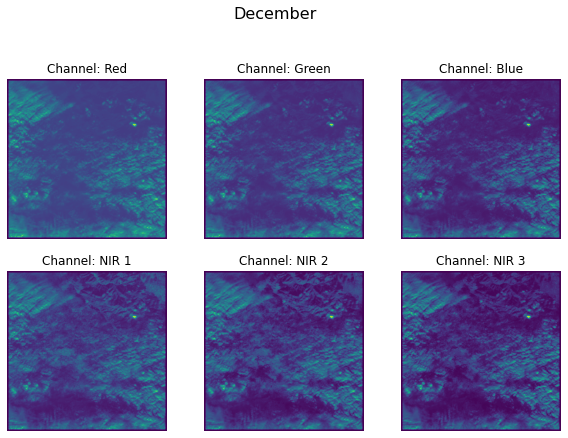

In [ ]:
for month in range(12):
    plt.figure(figsize=(10, 10))
    for channel in range(6): #show all six channels
        ax = plt.subplot(3, 3, channel+1)
        image = bands_public_test_pad[month, :, :, channel]
        plt.imshow(image)
        plt.title("Channel: " + channel_names[channel+1])
        plt.suptitle(calendar.month_name[month+1], size=16)
        plt.axis("off") 

In [ ]:
#1: NP array
y_pred_dim = img_size - 33 + 1
y_pred_public_test = np.zeros((y_pred_dim,y_pred_dim), dtype=int)
# add one dimension to be able feeding our model

#bands_public_test = np.expand_dims(bands_public_test, 0)
bands_public_test_pad = np.expand_dims(bands_public_test_pad, 0)
bands_public_test_pad.shape

#2: list
#y_pred_public_test = [[0]*468]*468 # 2D Liste 

#len(y_pred_public_test[5])
y_pred_public_test.shape

(1468, 1468)

In [ ]:
bands_public_test_pad.shape

(1, 12, 1532, 1532, 6)

In [ ]:
# Ausschnittskoordinaten für die Prediction definieren
x_coord_start = 15
x_coord_end = x_coord_start + 33

pred_size = (1500 - 33 + 1)

#Zeile zuerst predicted, danach Spalte
for cur_row in range(pred_size):
    # Ausschnittskoordinaten für die nächste Prediction erhöht
    x_coord_end   += 1
    x_coord_start += 1
    y_coord_start = 15
    y_coord_end = y_coord_start + 33
    
    #y_pred_hidden_test_unfinished_row = [] # Nr. 1
    for cur_col in range(pred_size):
        y_coord_end   += 1
        y_coord_start += 1
        # pass every month & color channel 
        current_cutout = bands_public_test_pad[:, :, x_coord_start:x_coord_end, y_coord_start:y_coord_end, :]
        #maybe month:month+1 with extra month loop (problematic, because you overwrite previous prediction

        y_pred = base_model.predict_classes(current_cutout)
        #del current_cutout
        y_pred_hidden_test_unfinished[cur_row][cur_col] = y_pred[0] # Nr. 2 Alles direkt in Liste predicten 
        #y_pred_hidden_test_unfinished_row.append(y_pred[0]) # Nr. 1 Spalte predicted

    #y_pred_hidden_test_unfinished[cur_col] = y_pred_hidden_test_unfinished_row # Nr. 1 Spalte in Liste hinzugefügt
    if(cur_row % 25 == 0):
      print(cur_row)
      #print(y_pred_hidden_test_unfinished[cur_row]) # Spaltenprediction printen


    #bin etwas über 125 gekommen

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


0
25
50
75
100
125


KeyboardInterrupt: ignored

In [ ]:
#%%script false
with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_hidden_unfinished.npy", "wb") as f:
    np.save(f, y_pred_public_test)

In [ ]:
#%%script false
with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_hidden_600.npy", "rb") as f:
    y_pred_hidden_600 = np.load(f)

In [32]:
y_pred_hidden.shape

(1468, 1468)

In [ ]:
%%time
# Ausschnittskoordinaten für die Prediction definieren
x_coord_start = 794 #15
x_coord_end = x_coord_start + 33

pred_size = (1500 - 33 + 1)

#Zeile zuerst predicted, danach Spalte
for cur_row in range(x_coord_start,1000):
    # Ausschnittskoordinaten für die nächste Prediction erhöht
    x_coord_end   += 1
    x_coord_start += 1
    y_coord_start = 15
    y_coord_end = y_coord_start + 33
    
    #y_pred_hidden_row = [] # Nr. 1
    for cur_col in range(pred_size):
        y_coord_end   += 1
        y_coord_start += 1
        # pass every month & color channel 
        current_cutout = bands_public_test_pad[:, :, x_coord_start:x_coord_end, y_coord_start:y_coord_end, :]
        #maybe month:month+1 with extra month loop (problematic, because you overwrite previous prediction

        y_pred = base_model.predict_classes(current_cutout)
        #del current_cutout
        y_pred_hidden[cur_row][cur_col] = y_pred[0] # Nr. 2 Alles direkt in Liste predicten 
        #y_pred_hidden_row.append(y_pred[0]) # Nr. 1 Spalte predicted

    #y_pred_hidden[cur_col] = y_pred_hidden_row # Nr. 1 Spalte in Liste hinzugefügt
    #if(cur_row % 25 == 0):
    print(
        str(cur_row) + " - " + 
        str(
            #round(
                100*cur_row/1468
            #,2
            )
        + "% - " + 
        str( 
            #round(
                (1468-cur_row) * 49.7 / (60*60)
                #, 2)
        ) + " h left")
      #print(y_pred_hidden[cur_row]) # Spaltenprediction printen
    # Status inkl. completed: 208
    if cur_row % 20 == 0:
      with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_hidden_" + str(cur_row) + ".npy", "wb") as f:
        np.save(f, y_pred_hidden)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


794 - 54.08719346049046% - 9.304944444444445 h left
795 - 54.155313351498634% - 9.291138888888888 h left
796 - 54.223433242506815% - 9.277333333333333 h left
797 - 54.29155313351499% - 9.26352777777778 h left
798 - 54.35967302452316% - 9.249722222222223 h left
799 - 54.427792915531334% - 9.235916666666668 h left
800 - 54.49591280653951% - 9.222111111111111 h left
801 - 54.56403269754768% - 9.208305555555556 h left
802 - 54.63215258855586% - 9.194500000000001 h left
803 - 54.700272479564035% - 9.180694444444445 h left
804 - 54.76839237057221% - 9.16688888888889 h left
805 - 54.83651226158038% - 9.153083333333333 h left
806 - 54.904632152588555% - 9.139277777777778 h left
807 - 54.97275204359673% - 9.125472222222223 h left
808 - 55.0408719346049% - 9.111666666666666 h left
809 - 55.10899182561308% - 9.097861111111111 h left
810 - 55.177111716621255% - 9.084055555555556 h left
811 - 55.24523160762943% - 9.07025 h left
812 - 55.3133514986376% - 9.056444444444445 h left
813 - 55.38147138964

In [30]:
# make a 3d numpy array that has a color channel dimension   
data_3d = np.ndarray(shape=(y_pred_hidden.shape[0], y_pred_hidden.shape[1],3), dtype=int)
for i in range(0, y_pred_hidden.shape[0]):
    for j in range(0, y_pred_hidden.shape[1]):
        data_3d[i][j] = color_map[y_pred_hidden[i,j]]
        #print(str(data_3d[i][j]) + "  -  " + str(y_pred_hidden[i,j]))

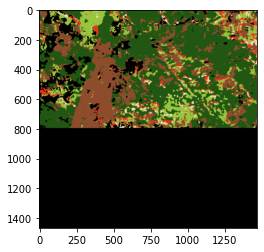

In [31]:
# display the plot 
fig, ax = plt.subplots(1,1)
ax.imshow(data_3d)

In [ ]:
#%%script false
with open("gdrive/My Drive/Wirtschaftsinformatik/lulc_data/y_pred_hidden_finished.npy", "wb") as f:
    np.save(f, y_pred_public_test)

In [ ]:
%%script false
current_cutout = []
x_start = 15 
for col in range(1468): 
  x_start += 1
  x_end = x_start + 33
  current_cutout.append(bands_public_test_pad[:, :, x_start:x_end, 16:49, :])

print(len(current_cutout))

In [ ]:
%%script false
pred = base_model.predict_classes((current_cutout))
print(pred)

In [ ]:
%%script false
cutout = bands_public_test_pad[:, :, y_coord_start:y_coord_end, y_coord_start:y_coord_end, :]


In [ ]:
%%script false
%%time

pred_size = (1500 - 33 + 1)
pred_size = 1

#Zeile zuerst predicted, danach Spalte
y_coord_start = 15
y_coord_end = y_coord_start + 33
y_pred_hidden = []
for cur_row in range(pred_size):
    # Ausschnittskoordinaten für die nächste Prediction erhöht
    y_coord_start += 1
    y_coord_end   += 1

    # pass every month & color channel 
    ### base_model.predict_classes([1. cutout], [2. cutout], [3. cutput])
    current_cutout = bands_public_test_pad[:, :, y_coord_start:y_coord_end, y_coord_start:y_coord_end, :]

    y_pred = [] 
    y_pred.append(base_model.predict_classes(current_cutout)) #depricated
    #(base_model.predict(current_cutout) > 0.5).astype("int32") #new version
    print(len(y_pred))
    print(y_pred.shape)
    print(y_pred)

    #y_pred_hidden.append(y_pred[0]) # Spalte predicted
    
    if(cur_row % 25 == 0):
      print(cur_row)
      #print(y_pred_public_test[cur_row]) # Spaltenprediction printen

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


InvalidArgumentError: ignored

In [ ]:
%%script false
#dauer prediction für ein Element
%%time
# Ausschnittskoordinaten für die Prediction definieren
x_coord_start = 15 #15
x_coord_end = x_coord_start + 33

pred_size = (1500 - 33 + 1)

for cur_row in range(x_coord_start,16):
    x_coord_end   += 1
    x_coord_start += 1
    y_coord_start = 15
    y_coord_end = y_coord_start + 33
    
    for cur_col in range(1):
        y_coord_end   += 1
        y_coord_start += 1

        current_cutout = bands_public_test_pad[:, :, x_coord_start:x_coord_end, y_coord_start:y_coord_end, :]

        y_pred = base_model.predict_classes(current_cutout)
        y_pred_hidden[cur_row][cur_col] = y_pred[0] 

CPU times: user 40.4 ms, sys: 2.08 ms, total: 42.4 ms
Wall time: 43.4 ms


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
